## 1. Business Understanding

- A manager at the bank is disturbed with more and more customers leaving their credit card services. They would really appreciate if one could predict for them who is gonna get churned so they can proactively go to the customer to provide them better services and turn customers' decisions in the opposite direction
- Now, this dataset consists of 10,000 customers mentioning their age, salary, marital_status, credit card limit, credit card category, etc. There are nearly 18 features.
- This dataset is taken from [https://www.kaggle.com/sakshigoyal7/credit-card-customers](https://www.kaggle.com/sakshigoyal7/credit-card-customers)

## 2. Data Understanding/ Acquire

- This dataset consists of 10,000 customers
- Dataset features:
    - CLIENTNUM: Client number. Unique identifier for the customer holding the account
    - Attrition_Flag: Internal event (customer activity) variable - if the account is closed then 1 else 0
    - Customer_Age: Customer's Age in Years
    - Gender: M=Male, F=Female
    - Dependent_count: Number of dependents
    - Education_Level: Educational Qualification of the account holder (example: high school, college graduate, etc.)
    - Marital_Status: Married, Single, Divorced, Unknown
    - Income_Category: Annual Income Category of the account holder (<40K, 40K - 60K, 60K - 80K, 80K-120K, > 120K, Unknown)
    - Card_Category: Type of Card (Blue, Silver, Gold, Platinum)
    - Months_on_book: Period of relationship with bank
    - Total_Relationship_Count: Total no. of products held by the customer
    - Months_Inactive_12_mon: No. of months inactive in the last 12 months
    - Contacts_Count_12_mon: No. of Contacts in the last 12 months
    - Credit_Limit: Credit Limit on the Credit Card
    - Total_Revolving_Bal: Total Revolving Balance on the Credit Card
    - Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
    - Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
    - Total_Trans_Amt: Total Transaction Amount (Last 12 months)
    - Total_Trans_Ct: Total Transaction Count (Last 12 months)
    - Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
    - Avg_Utilization_Ratio: Average Card Utilization Ratio

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
sns.set()

In [2]:
df = pd.read_csv('BankChurners.csv', )
df.shape

(10127, 23)

In [3]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [4]:
df = df.iloc[:, :21]

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [6]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


### 2.1 Define type of variable
    1. Input: <> Attrition_Flag
    2. Output: Attrition_Flag
    3. Type of variable: 
        3.1 Predictor: <> Attrition_Flag
        3.2 Target: Attrition_Flag
    4. Data type:
        4.1 Charactor/ String
        4.2 Numeric
    5. Variable Category

In [7]:
numbers = df.select_dtypes(exclude='object').columns.tolist()

In [8]:
numbers

['CLIENTNUM',
 'Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

In [9]:
objects = df.select_dtypes('object').columns.tolist()

In [10]:
objects

['Attrition_Flag',
 'Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

    5. Variable
        5.1 Categorical:
        5.2 Continuous

In [11]:
# Categorical:
i = 1
for obj in objects:
    print(i, '/', obj, '\t', len(df[obj].unique()), ':', df[obj].unique())
    i = i+1

1 / Attrition_Flag 	 2 : ['Existing Customer' 'Attrited Customer']
2 / Gender 	 2 : ['M' 'F']
3 / Education_Level 	 7 : ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
4 / Marital_Status 	 4 : ['Married' 'Single' 'Unknown' 'Divorced']
5 / Income_Category 	 6 : ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
6 / Card_Category 	 4 : ['Blue' 'Gold' 'Silver' 'Platinum']


In [12]:
# Categorical & Continuous:
for obj in numbers:
    print(i, '/', obj, '\t', len(df[obj].unique()), ':', 
          df[obj].unique() if len(df[obj].unique()) < 150 else 'Continuous' )
    i = i+1

7 / CLIENTNUM 	 10127 : Continuous
8 / Customer_Age 	 45 : [45 49 51 40 44 32 37 48 42 65 56 35 57 41 61 47 62 54 59 63 53 58 55 66
 50 38 46 52 39 43 64 68 67 60 73 70 36 34 33 26 31 29 30 28 27]
9 / Dependent_count 	 6 : [3 5 4 2 0 1]
10 / Months_on_book 	 44 : [39 44 36 34 21 46 27 31 54 30 48 37 56 42 49 33 28 38 41 43 45 52 40 50
 35 47 32 20 29 25 53 24 55 23 22 26 13 51 19 15 17 18 16 14]
11 / Total_Relationship_Count 	 6 : [5 6 4 3 2 1]
12 / Months_Inactive_12_mon 	 7 : [1 4 2 3 6 0 5]
13 / Contacts_Count_12_mon 	 7 : [3 2 0 1 4 5 6]
14 / Credit_Limit 	 6205 : Continuous
15 / Total_Revolving_Bal 	 1974 : Continuous
16 / Avg_Open_To_Buy 	 6813 : Continuous
17 / Total_Amt_Chng_Q4_Q1 	 1158 : Continuous
18 / Total_Trans_Amt 	 5033 : Continuous
19 / Total_Trans_Ct 	 126 : [ 42  33  20  28  24  31  36  32  26  17  29  27  21  30  16  18  23  22
  40  38  25  43  37  19  35  15  41  57  12  14  34  44  13  47  10  39
  53  50  52  48  49  45  11  55  46  54  60  51  63  58  59  61  7

In [13]:
categorical_nums = ['Customer_Age', 'Dependent_count', 'Months_on_book', 
                    'Total_Relationship_Count', 'Months_Inactive_12_mon',
                   'Contacts_Count_12_mon']

In [14]:
continuous = [i for i in (set(numbers) - set(categorical_nums))]

In [15]:
continuous

['Total_Trans_Amt',
 'Avg_Utilization_Ratio',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'CLIENTNUM',
 'Credit_Limit',
 'Total_Ct_Chng_Q4_Q1',
 'Total_Trans_Ct']

### 2.2 Univariate Analysis

#### 2.2.1 Object

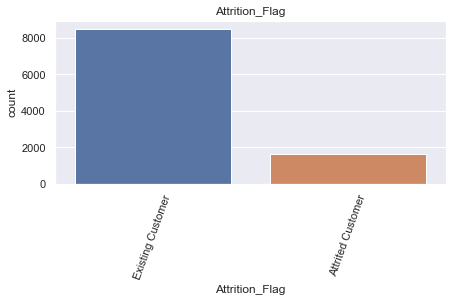

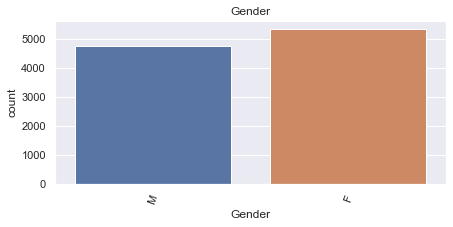

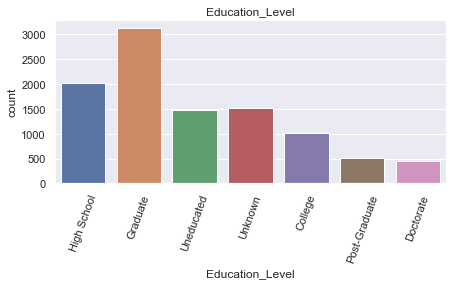

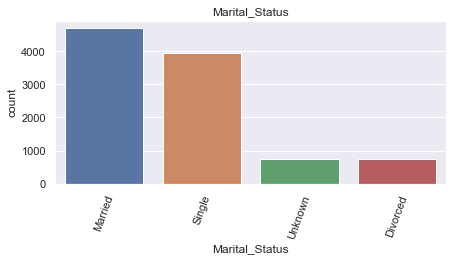

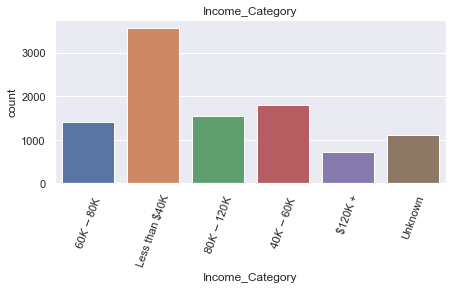

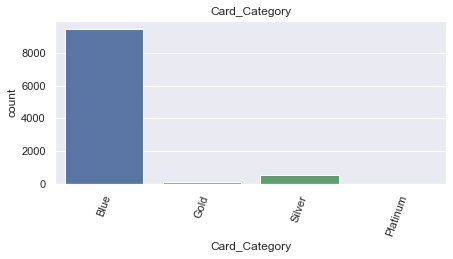

In [16]:
for obj in objects:
    plt.figure(figsize=(7,3))
    sns.countplot(df[obj])
    plt.title(obj)
    plt.xticks(rotation=70);

- High imbalabce between attrited and existing customer
- There is no significant imbalance between M and F in our customer
- For marital_status, we can combine unknown and divorce in 1 categorical
- almost our customer hold blue card
- Majority of customers has income less than $40k

#### 2.2.2 Numbers

In [17]:
import pandas_profiling as pp

In [18]:
profile = pp.ProfileReport(df[numbers])
profile

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

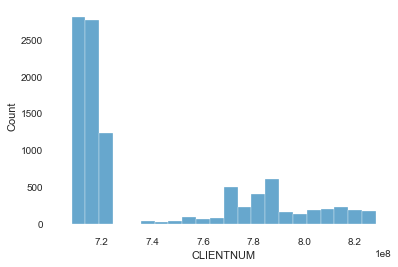

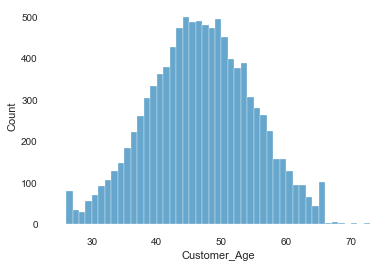

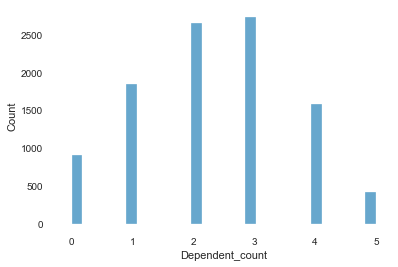

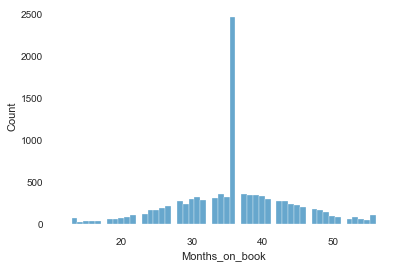

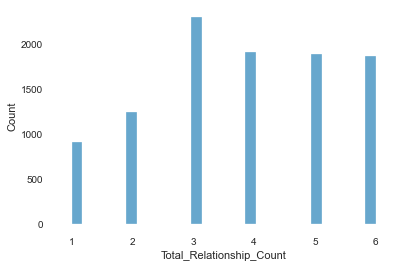

...

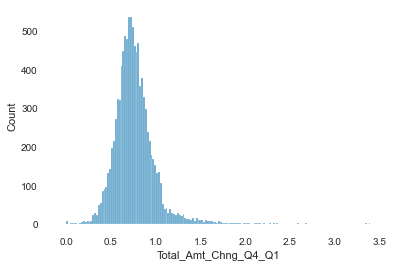

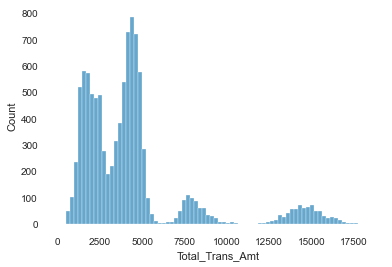

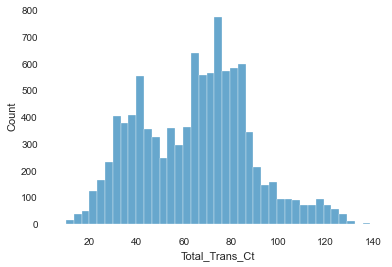

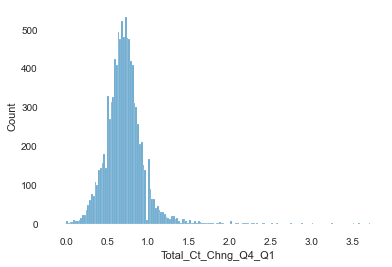

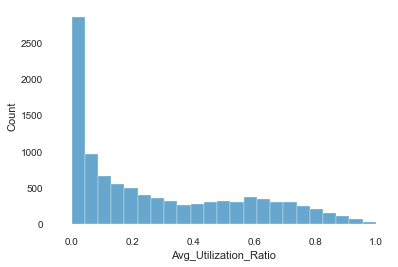

In [19]:
for obj in numbers:
    plt.figure(figsize=(6,4))
    sns.histplot(df[obj])

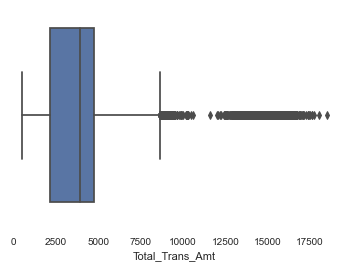

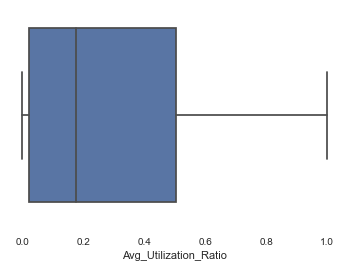

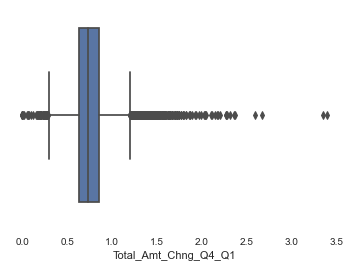

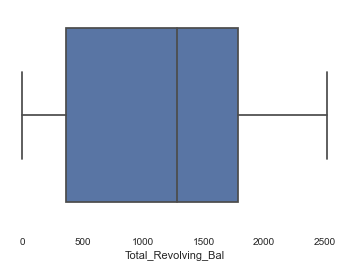

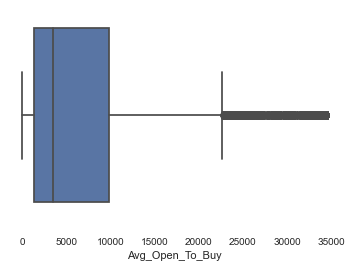

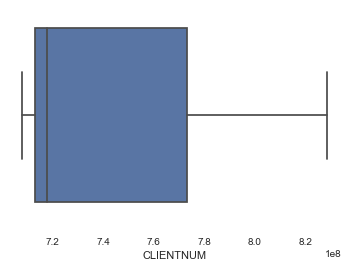

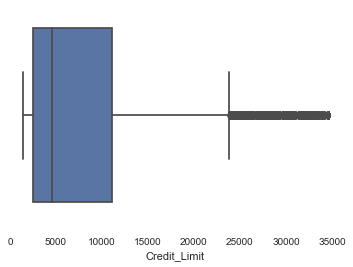

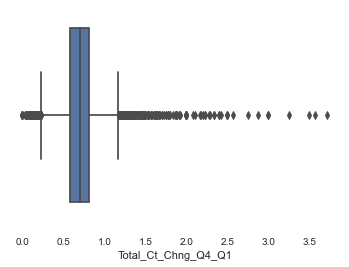

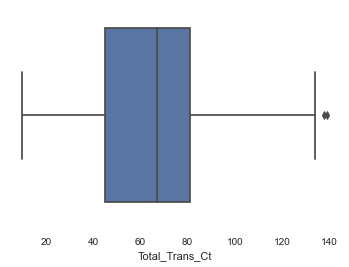

In [20]:
for obj in continuous:
    plt.figure(figsize=(6,4))
    sns.boxplot(df[obj])

- There are lots of ouliers in 'Credit_Limit', 'Total_Amt_Chng_Q4_Q1', 'Avg_Open_To_Buy', 'Total_Trans_Amt', 'Total_Ct_Chng_Q4_Q1'
- But these ouliers have their meaning, we cannot remove or change them
- There are huge differences in scale between these features  
    => We can think about the Robust Scaler later

### 2.3 Multivariate Analysis

#### 2.3.1 Continuous - Continuous

<AxesSubplot:>

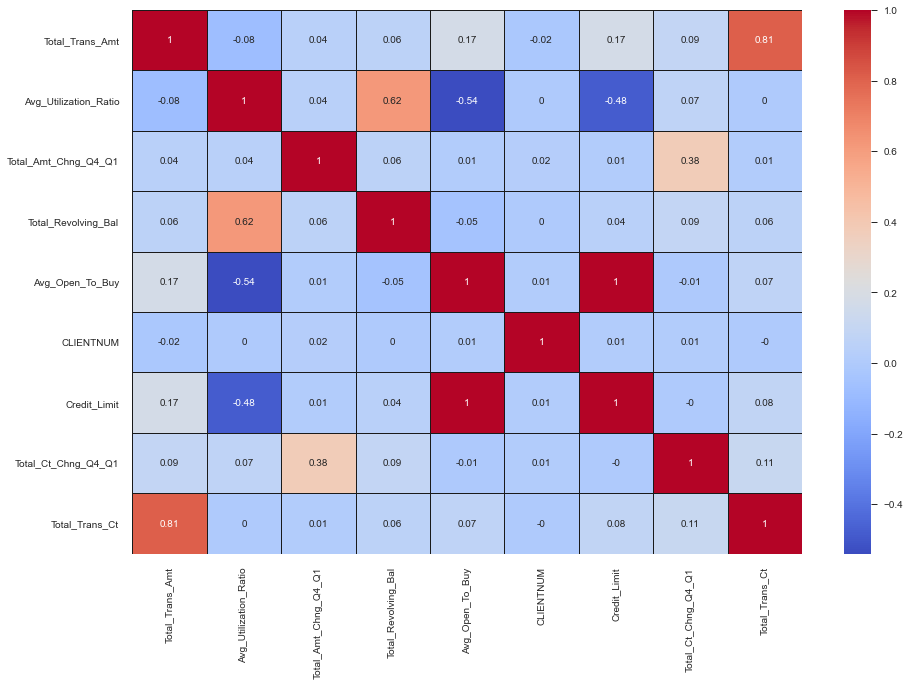

In [21]:
plt.figure(figsize=(15,10))
sns.heatmap(df[continuous].corr().round(2), cmap='coolwarm', annot=True, linecolor='k', linewidths=0.5)

- The CLIENTNUM is not a feature relate to our model => we can remove this feature
- The Credit_limit and Avg_Open_To_Buy have perfectly correlation => we keep only 1 feature: Credit_Limit
- 'Total_Trans_Amt' and 'Total_Trans_Ct' have very strong correlation => we consider to keep only 1 feature

In [22]:
continuous.remove('CLIENTNUM')

In [23]:
continuous.remove('Avg_Open_To_Buy')

In [24]:
df_new = df.drop(columns=['CLIENTNUM', 'Avg_Open_To_Buy'])

In [25]:
df_new.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,2.175,816,28,2.500,0.000


In [26]:
df_new.shape

(10127, 19)

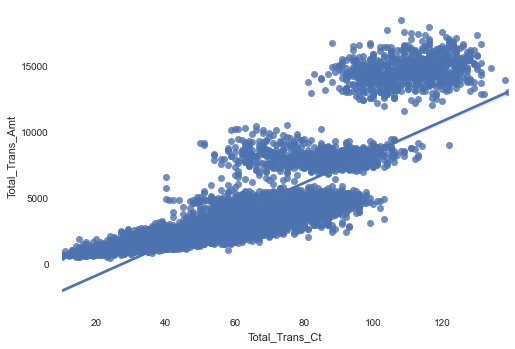

In [27]:
sns.regplot(data=df_new, y='Total_Trans_Amt', x='Total_Trans_Ct');

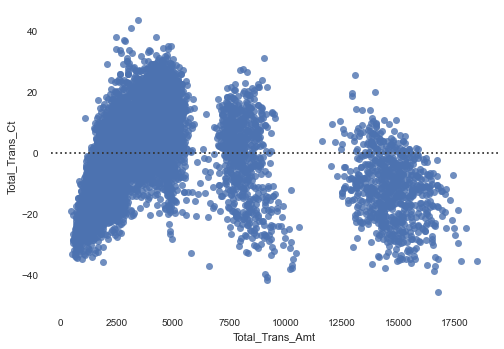

In [28]:
sns.residplot(data=df_new, x='Total_Trans_Amt', y='Total_Trans_Ct');

- We can see 3 different cluster in the relation between Total_Trans_Ct and Total_Trans_Amt  
=> Re_thinking about keep these 2 features

#### 2.3.2 Categorical - Categorical

- We analysis the correlation between the categorical input features with the categorical output (target)  

In [29]:
objects.extend(categorical_nums)

In [30]:
objects

['Attrition_Flag',
 'Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category',
 'Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon']

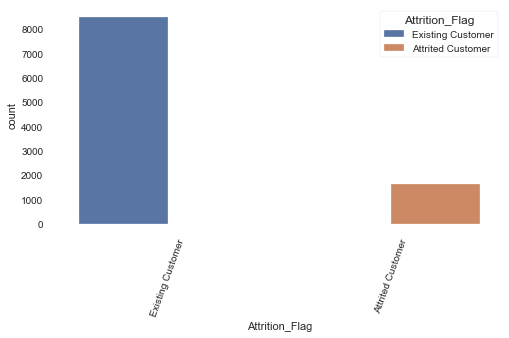

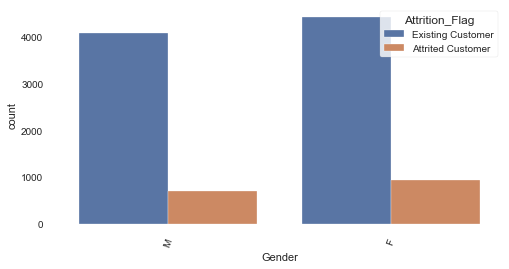

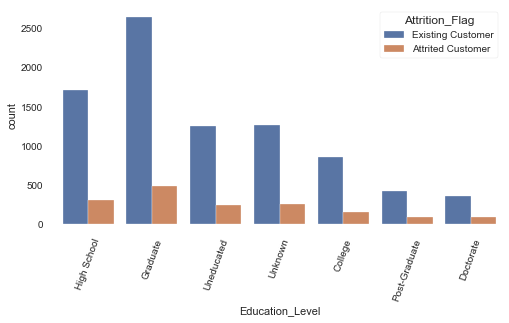

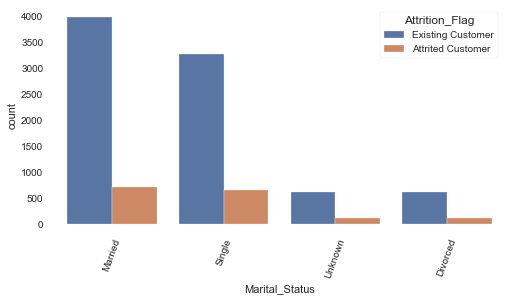

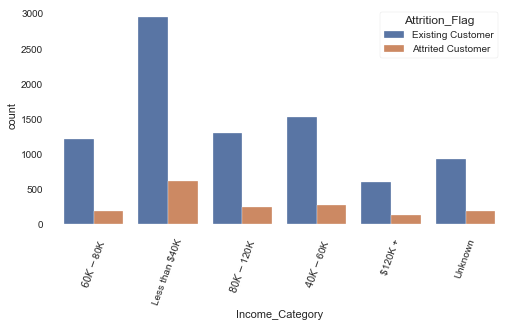

...

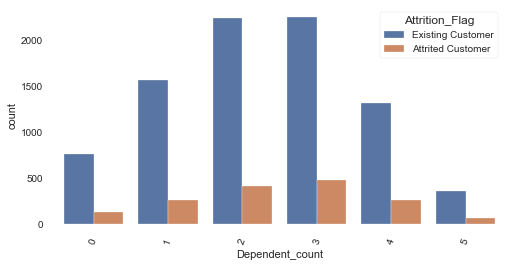

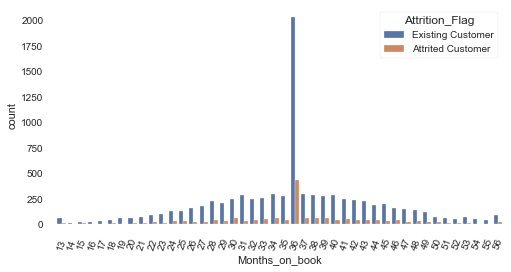

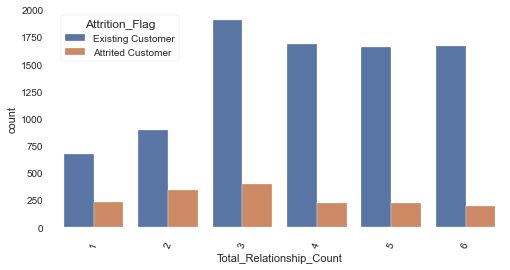

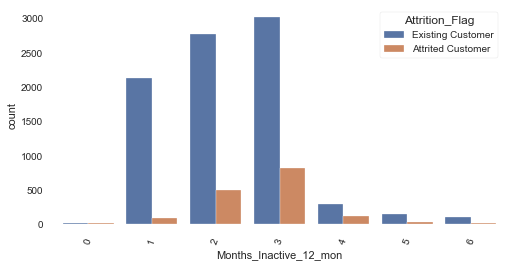

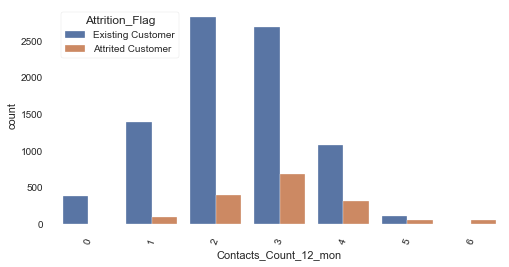

In [31]:
for obj in objects:
    plt.figure(figsize=(8,4))
    sns.countplot(data=df_new[objects], x=obj, hue='Attrition_Flag')
    plt.xticks(rotation = 70)

In [32]:
obj_inputs = objects.copy()
obj_inputs.remove('Attrition_Flag')

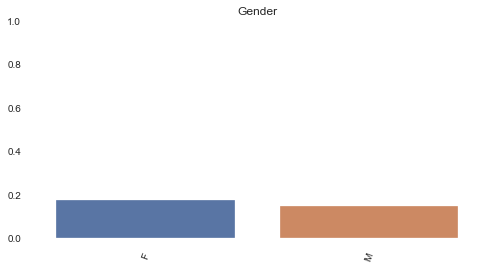

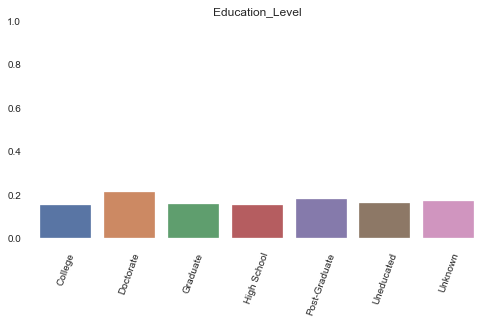

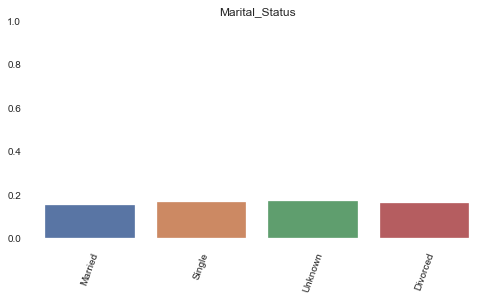

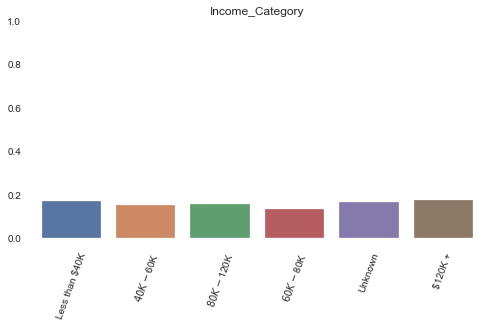

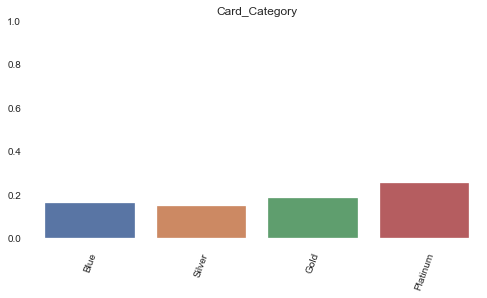

...

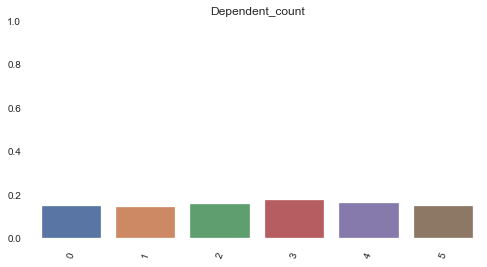

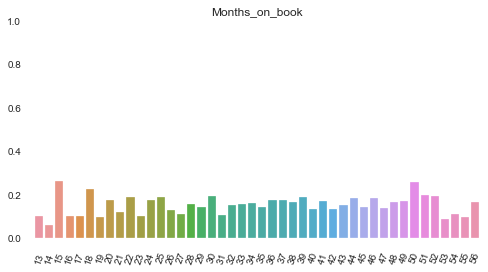

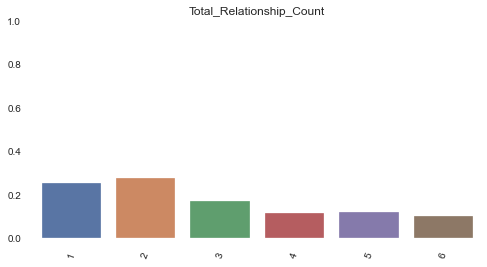

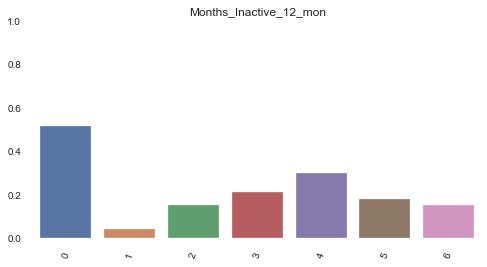

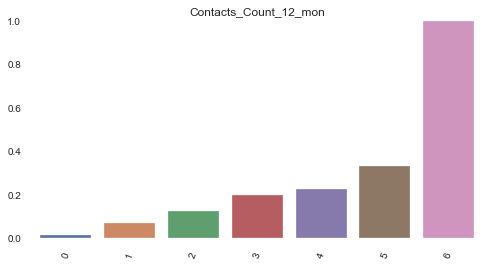

In [33]:
for obj in obj_inputs:
    result = df[df['Attrition_Flag'] == 'Attrited Customer'][obj].value_counts()/ df[obj].value_counts()
    plt.figure(figsize=(8,4))
    sns.barplot(x=result.index, y = result.values)
    plt.title(obj)
    plt.xticks(rotation = 70)
    plt.ylim(0,1)

In [34]:
from scipy.stats import chi2, chi2_contingency
prob = {}
for obj in obj_inputs:
    table = pd.crosstab(df_new[obj], df_new['Attrition_Flag'])
    stat, p, dof, expected = chi2_contingency(table)
    prob[obj] = p

In [35]:
prob

{'Gender': 0.00019635846717310307,
 'Education_Level': 0.05148913147336634,
 'Marital_Status': 0.10891263394840227,
 'Income_Category': 0.025002425704390617,
 'Card_Category': 0.5252382797994759,
 'Customer_Age': 0.02082917739428747,
 'Dependent_count': 0.09150463456682643,
 'Months_on_book': 0.05742908739736116,
 'Total_Relationship_Count': 2.6610499913717976e-59,
 'Months_Inactive_12_mon': 1.6155198022594863e-82,
 'Contacts_Count_12_mon': 1.7769862229780962e-123}

In [36]:
dependence = []
independence = []
for key, value in prob.items():
    if value <= 0.05:
        dependence.append(key)
    else: independence.append(key)

In [37]:
(dependence, independence)

(['Gender',
  'Income_Category',
  'Customer_Age',
  'Total_Relationship_Count',
  'Months_Inactive_12_mon',
  'Contacts_Count_12_mon'],
 ['Education_Level',
  'Marital_Status',
  'Card_Category',
  'Dependent_count',
  'Months_on_book'])

- There are 6 features has the correlation with our targer
- We can remove the features that do not have the correlation with our target 

In [38]:
df_new.drop(columns=independence, inplace=True)

In [39]:
df_new.head()

,Attrition_Flag,Customer_Age,Gender,Income_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,$60K - $80K,5,1,3,12691.0,777,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,Less than $40K,6,1,2,8256.0,864,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,$80K - $120K,4,1,0,3418.0,0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,Less than $40K,3,4,1,3313.0,2517,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,$60K - $80K,5,1,0,4716.0,0,2.175,816,28,2.500,0.000


#### 2.3.3 Continuous - Categorical

- We analysis the correlation between the continuous features and our target

In [40]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [41]:
continuous

['Total_Trans_Amt',
 'Avg_Utilization_Ratio',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Revolving_Bal',
 'Credit_Limit',
 'Total_Ct_Chng_Q4_Q1',
 'Total_Trans_Ct']

In [42]:
cont_cate = {}
for obj in continuous:
    model = ols(f'{obj} ~ C(Attrition_Flag)', data=df_new ).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    cont_cate[obj] = anova_table['PR(>F)'][0]

In [43]:
cont_cate

{'Total_Trans_Amt': 1.8574386556570262e-65,
 'Avg_Utilization_Ratio': 3.357689328231306e-73,
 'Total_Amt_Chng_Q4_Q1': 4.836642703629175e-40,
 'Total_Revolving_Bal': 6.630148455435039e-160,
 'Credit_Limit': 0.01628535720522129,
 'Total_Ct_Chng_Q4_Q1': 1.6477247847265096e-195,
 'Total_Trans_Ct': 0.0}

In [44]:
impact = []
not_impact = []
for key, value in cont_cate.items():
    if value <= 0.05:
        impact.append(key)
    else: not_impact.append(key)

In [45]:
(impact, not_impact)

(['Total_Trans_Amt',
  'Avg_Utilization_Ratio',
  'Total_Amt_Chng_Q4_Q1',
  'Total_Revolving_Bal',
  'Credit_Limit',
  'Total_Ct_Chng_Q4_Q1',
  'Total_Trans_Ct'],
 [])

- All the continuous feature has the impact to our target

## 3. Features Engineering

In [46]:
# transform gender 
df_new = pd.get_dummies(data=df_new, columns=['Gender'], drop_first=True)

In [199]:
df_new

,Customer_Age,Income_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Churn
0,45,3,5,1,3,12691.0,777,1.335,1144,42,1.625,0.061,1,0
1,49,1,6,1,2,8256.0,864,1.541,1291,33,3.714,0.105,0,0
2,51,4,4,1,0,3418.0,0,2.594,1887,20,2.333,0.000,1,0
3,40,1,3,4,1,3313.0,2517,1.405,1171,20,2.333,0.760,0,0
4,40,3,5,1,0,4716.0,0,2.175,816,28,2.500,0.000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,3,2,3,4003.0,1851,0.703,15476,117,0.857,0.462,1,0
10123,41,2,4,2,3,4277.0,2186,0.804,8764,69,0.683,0.511,1,1
10124,44,1,5,3,4,5409.0,0,0.819,10291,60,0.818,0.000,0,1
10125,30,2,4,3,3,5281.0,0,0.535,8395,62,0.722,0.000,1,1


In [48]:
# Label Encoder for 'Income_Category'
df_new['Income_Category'].replace(df_new['Income_Category'].unique().tolist(), [3,1,4,2,5,0], inplace=True)

In [49]:
df_new.head()

,Attrition_Flag,Customer_Age,Income_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M
0,Existing Customer,45,3,5,1,3,12691.0,777,1.335,1144,42,1.625,0.061,1
1,Existing Customer,49,1,6,1,2,8256.0,864,1.541,1291,33,3.714,0.105,0
2,Existing Customer,51,4,4,1,0,3418.0,0,2.594,1887,20,2.333,0.000,1
3,Existing Customer,40,1,3,4,1,3313.0,2517,1.405,1171,20,2.333,0.760,0
4,Existing Customer,40,3,5,1,0,4716.0,0,2.175,816,28,2.500,0.000,1


In [50]:
df_new = pd.get_dummies(data=df_new, columns=['Attrition_Flag'])

In [51]:
df_new.drop('Attrition_Flag_Existing Customer', axis=1, inplace=True)

In [52]:
df_new.rename(columns={'Attrition_Flag_Attrited Customer': 'Churn'}, inplace=True)

In [53]:
df_new.head()

,Customer_Age,Income_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Churn
0,45,3,5,1,3,12691.0,777,1.335,1144,42,1.625,0.061,1,0
1,49,1,6,1,2,8256.0,864,1.541,1291,33,3.714,0.105,0,0
2,51,4,4,1,0,3418.0,0,2.594,1887,20,2.333,0.000,1,0
3,40,1,3,4,1,3313.0,2517,1.405,1171,20,2.333,0.760,0,0
4,40,3,5,1,0,4716.0,0,2.175,816,28,2.500,0.000,1,0


## 4. Modeling & Evaluation

In [54]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier

import datetime
from sklearn.model_selection import cross_val_score, train_test_split
import numpy as np

In [55]:
X = df_new.drop('Churn', axis=1)
y= df_new['Churn']

In [56]:
# Logistic, Naive bayes, SVM, RandomForesrClassifier, DecisionTreeClassifier
models = [
    LogisticRegression(max_iter=200),
    GaussianNB(),
    RandomForestClassifier(n_estimators=200),
    DecisionTreeClassifier(),
    KNeighborsClassifier(n_neighbors=6),
    XGBClassifier(random_state = 42)
]
CV = 10
entries = []
i = 0

for model in models:
    scores_train = []
    scores_test = []
    times = []
    abs_scores = []
    for j in range(CV):
        X_train, X_test, y_train, y_test = train_test_split(X,y,
                                                           test_size=0.3)
        t1 = datetime.datetime.now()
        model_name = model.__class__.__name__
        model.fit(X_train, y_train)
        t2 = datetime.datetime.now()
        d = round((t2 - t1).microseconds/1000,1) # => miliseconds
        score_train = model.score(X_train, y_train)
        score_test = model.score(X_test, y_test)
        abs_score = abs(score_train - score_test)
        
        scores_train.append(score_train)
        scores_test.append(score_test)
        abs_scores.append(abs_score)
        times.append(d)
        
    print(model.__class__.__name__, scores_test)
    entries.append([model_name, np.array(score_train).mean(),
                   np.array(score_test).mean(), np.array(abs_scores).mean(),
                   np.array(times).mean()])
    # i += 1
cv_df = pd.DataFrame(entries,
                    columns=['model_name', 'score_train_mean',
                            'score_test_mean', 'abs_score_mean', 'time_mean'])

LogisticRegression [0.8838433695294505, 0.8884501480750246, 0.8930569266205989, 0.8775913129318855, 0.8864758144126358, 0.8861467588022376, 0.8845014807502468, 0.8792365909838763, 0.8861467588022376, 0.8825271470878578]
GaussianNB [0.8877920368542284, 0.8933859822309971, 0.8940440934517934, 0.8956893715037841, 0.8848305363606449, 0.8910825929582099, 0.8848305363606449, 0.8960184271141823, 0.8956893715037841, 0.8871339256334321]
RandomForestClassifier [0.9611714379730174, 0.9690687726225732, 0.9697268838433696, 0.9634748272458046, 0.9608423823626193, 0.9565646594274433, 0.9634748272458046, 0.9631457716354064, 0.9624876604146101, 0.9644619940769991]
DecisionTreeClassifier [0.9322145442579796, 0.9447186574531096, 0.926949654491609, 0.9364922671931556, 0.9378084896347483, 0.9486673247778875, 0.9341888779203685, 0.9391247120763409, 0.9348469891411648, 0.9348469891411648]
KNeighborsClassifier [0.8943731490621916, 0.8854886475814413, 0.8966765383349786, 0.8970055939453768, 0.8854886475814413,

In [57]:
cv_df

,model_name,score_train_mean,score_test_mean,abs_score_mean,time_mean
0,LogisticRegression,0.887556,0.882527,0.003869,64.02
1,GaussianNB,0.899972,0.887134,0.005882,2.21
2,RandomForestClassifier,1.000000,0.964462,0.036558,302.74
3,DecisionTreeClassifier,1.000000,0.934847,0.063014,33.20
4,KNeighborsClassifier,0.910412,0.892399,0.021728,16.55
5,XGBClassifier,1.000000,0.972688,0.030207,326.55


In [58]:
from sklearn.preprocessing import RobustScaler

In [59]:
scaler = RobustScaler()

In [60]:
X_scale = scaler.fit_transform(X)
X_scale = pd.DataFrame(X_scale, columns=X.columns)
X_scale

,Customer_Age,Income_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M
0,-0.090909,0.5,0.5,-1.0,1.0,0.956476,-0.350175,2.627193,-1.065558,-0.694444,3.911017,-0.239583,1.0
1,0.272727,-0.5,1.0,-1.0,0.0,0.435477,-0.289123,3.530702,-1.008702,-0.944444,12.762712,-0.147917,0.0
2,0.454545,1.0,0.0,-1.0,-2.0,-0.132863,-0.895439,8.149123,-0.778186,-1.305556,6.911017,-0.366667,1.0
3,-0.545455,-0.5,-0.5,2.0,-1.0,-0.145198,0.870877,2.934211,-1.055115,-1.305556,6.911017,1.216667,0.0
4,-0.545455,0.5,0.5,-1.0,-2.0,0.019618,-0.895439,6.311404,-1.192419,-1.083333,7.618644,-0.366667,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0.363636,0.0,-0.5,0.0,1.0,-0.064141,0.403509,-0.144737,4.477664,1.388889,0.656780,0.595833,1.0
10123,-0.454545,0.0,0.0,0.0,1.0,-0.031953,0.638596,0.298246,1.881648,0.055556,-0.080508,0.697917,1.0
10124,-0.181818,-0.5,0.5,1.0,2.0,0.101028,-0.895439,0.364035,2.472249,-0.194444,0.491525,-0.366667,0.0
10125,-1.454545,0.0,0.0,1.0,1.0,0.085991,-0.895439,-0.881579,1.738929,-0.138889,0.084746,-0.366667,1.0


In [61]:
# Logistic, Naive bayes, SVM, RandomForesrClassifier, DecisionTreeClassifier
models = [
    LogisticRegression(max_iter=200),
    GaussianNB(),
    RandomForestClassifier(n_estimators=200),
    DecisionTreeClassifier(),
    KNeighborsClassifier(n_neighbors=6),
    XGBClassifier(random_state = 42)
]
CV = 10
entries = []
i = 0

for model in models:
    scores_train = []
    scores_test = []
    times = []
    abs_scores = []
    for j in range(CV):
        X_train, X_test, y_train, y_test = train_test_split(X_scale,y,
                                                           test_size=0.3)
        t1 = datetime.datetime.now()
        model_name = model.__class__.__name__
        model.fit(X_train, y_train)
        t2 = datetime.datetime.now()
        d = round((t2 - t1).microseconds/1000,1) # => miliseconds
        score_train = model.score(X_train, y_train)
        score_test = model.score(X_test, y_test)
        abs_score = abs(score_train - score_test)
        
        scores_train.append(score_train)
        scores_test.append(score_test)
        abs_scores.append(abs_score)
        times.append(d)
        
    print(model.__class__.__name__, scores_test)
    entries.append([model_name, np.array(score_train).mean(),
                   np.array(score_test).mean(), np.array(abs_scores).mean(),
                   np.array(times).mean()])
    # i += 1
cv_df_scale = pd.DataFrame(entries,
                    columns=['model_name', 'score_train_mean',
                            'score_test_mean', 'abs_score_mean', 'time_mean'])

LogisticRegression [0.8973346495557749, 0.9006252056597565, 0.9075353734781179, 0.9091806515301086, 0.9042448173741362, 0.9042448173741362, 0.9019414281013491, 0.9045738729845344, 0.9016123724909509, 0.8933859822309971]
GaussianNB [0.8864758144126358, 0.8874629812438302, 0.8947022046725897, 0.8923988153998026, 0.8993089832181639, 0.8805528134254689, 0.8795656465942744, 0.889108259295821, 0.8956893715037841, 0.8884501480750246]
RandomForestClassifier [0.9624876604146101, 0.9634748272458046, 0.9664363277393879, 0.9615004935834156, 0.9565646594274433, 0.9608423823626193, 0.9601842711418229, 0.9641329384666009, 0.9647910496873972, 0.9585389930898321]
DecisionTreeClassifier [0.9361632115827575, 0.9391247120763409, 0.9358341559723593, 0.9404409345179335, 0.9427443237907206, 0.9440605462323133, 0.9397828232971372, 0.9453767686739059, 0.9364922671931556, 0.930898321816387]
KNeighborsClassifier [0.9190523198420533, 0.918394208621257, 0.9170779861796644, 0.9167489305692662, 0.9114840408028957, 0

In [62]:
cv_df_scale

,model_name,score_train_mean,score_test_mean,abs_score_mean,time_mean
0,LogisticRegression,0.906885,0.893386,0.005181,12.70
1,GaussianNB,0.888685,0.888450,0.007311,2.09
2,RandomForestClassifier,1.000000,0.958539,0.038105,272.59
3,DecisionTreeClassifier,1.000000,0.930898,0.060908,31.60
4,KNeighborsClassifier,0.938911,0.909510,0.017755,17.25
5,XGBClassifier,1.000000,0.969398,0.029549,320.67


In [63]:
cv_df

,model_name,score_train_mean,score_test_mean,abs_score_mean,time_mean
0,LogisticRegression,0.887556,0.882527,0.003869,64.02
1,GaussianNB,0.899972,0.887134,0.005882,2.21
2,RandomForestClassifier,1.000000,0.964462,0.036558,302.74
3,DecisionTreeClassifier,1.000000,0.934847,0.063014,33.20
4,KNeighborsClassifier,0.910412,0.892399,0.021728,16.55
5,XGBClassifier,1.000000,0.972688,0.030207,326.55


- XGBoost, Randomforest and DecisionTree have the highest accuracy.
- GaussianNB is the fastest algorism

In [64]:
X_train, X_test, y_train, y_test = train_test_split(X,y,
                                                   test_size=0.3,
                                                   random_state=42)

In [65]:
X_train_scale, X_test_scale, y_train, y_test = train_test_split(X_scale,y,
                                                   test_size=0.3,
                                                   random_state=42)

In [66]:
from imblearn.over_sampling import SMOTE

In [67]:
sm = SMOTE(random_state=42)

In [68]:
X_train_resample, y_train_resample = sm.fit_resample(X_train, y_train)

In [69]:
X_train_resample_sc, y_train_resample_sc = sm.fit_resample(X_train_scale, y_train)

### 3.1 Gaussian Naive Bayes

In [106]:
g_nb = GaussianNB()
raw_nb = g_nb.fit(X_train, y_train)

In [107]:
y_pred_nb = raw_nb.predict(X_test)

In [108]:
from sklearn.metrics import classification_report

In [109]:
print(classification_report(y_test, y_pred_nb))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93      2543
           1       0.66      0.58      0.62       496

    accuracy                           0.88      3039
   macro avg       0.79      0.76      0.77      3039
weighted avg       0.88      0.88      0.88      3039



In [110]:
# predict probability
y_pred_proba = raw_nb.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

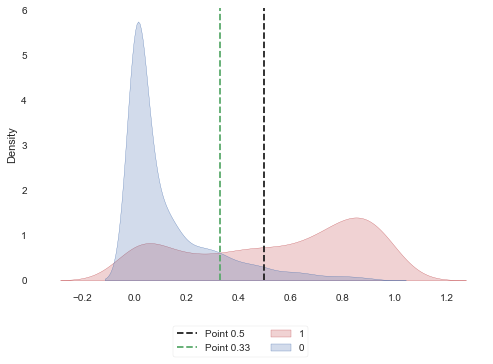

In [111]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.33, ls = '--', color = 'g', label = 'Point 0.33')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [112]:
y_pred_now = pos_proba > 0.33
y_pred_now

array([False, False, False, ..., False, False, False])

In [113]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.94      0.87      0.90      2543
           1       0.52      0.71      0.60       496

    accuracy                           0.84      3039
   macro avg       0.73      0.79      0.75      3039
weighted avg       0.87      0.84      0.85      3039



- Change the threshold can improve the recall of churn customer

In [114]:
re_nb = g_nb.fit(X_train_resample, y_train_resample)

In [115]:
y_pred_nb_re = re_nb.predict(X_test)

In [116]:
print(classification_report(y_test, y_pred_nb_re))

              precision    recall  f1-score   support

           0       0.95      0.79      0.86      2543
           1       0.42      0.77      0.54       496

    accuracy                           0.79      3039
   macro avg       0.68      0.78      0.70      3039
weighted avg       0.86      0.79      0.81      3039



In [117]:
# predict probability
y_pred_proba = re_nb.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

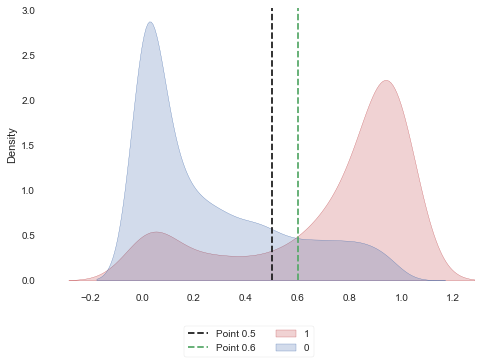

In [118]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.6, ls = '--', color = 'g', label = 'Point 0.6')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

### 3.2 Logistic Regression

In [119]:
lg = LogisticRegression(max_iter=200)

In [120]:
raw_lg = lg.fit(X_train, y_train)

In [121]:
y_pred_lg = raw_lg.predict(X_test)

In [122]:
print(classification_report(y_test, y_pred_lg))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      2543
           1       0.73      0.42      0.53       496

    accuracy                           0.88      3039
   macro avg       0.81      0.69      0.73      3039
weighted avg       0.87      0.88      0.87      3039



In [123]:
# predict probability
y_pred_proba = raw_lg.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

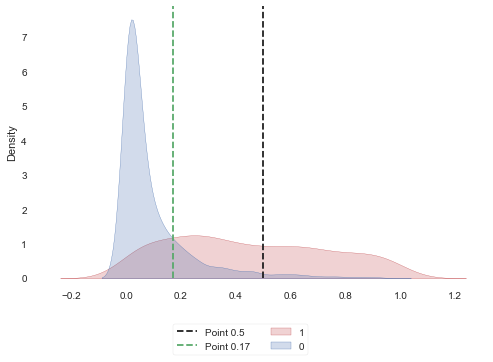

In [124]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.17, ls = '--', color = 'g', label = 'Point 0.17')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [125]:
y_pred_now = pos_proba > 0.17
y_pred_now

array([False, False, False, ..., False,  True,  True])

In [126]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.95      0.83      0.89      2543
           1       0.48      0.80      0.60       496

    accuracy                           0.82      3039
   macro avg       0.72      0.81      0.74      3039
weighted avg       0.88      0.82      0.84      3039



In [127]:
scale_lg = lg.fit(X_train_scale, y_train)

In [128]:
print(classification_report(y_test, scale_lg.predict(X_test_scale)))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      2543
           1       0.77      0.53      0.63       496

    accuracy                           0.90      3039
   macro avg       0.84      0.75      0.78      3039
weighted avg       0.89      0.90      0.89      3039



In [129]:
# predict probability
y_pred_proba = scale_lg.predict_proba(X_test_scale)
# take the churn probability
pos_proba = y_pred_proba[:,1]

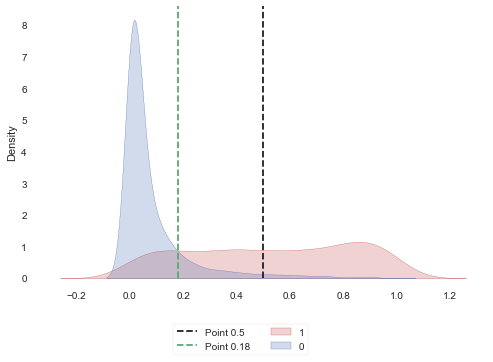

In [130]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.18, ls = '--', color = 'g', label = 'Point 0.18')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [131]:
re_lg = lg.fit(X_train_resample_sc, y_train_resample_sc)

In [132]:
print(classification_report(y_test, scale_lg.predict(X_test_scale)))

              precision    recall  f1-score   support

           0       0.96      0.86      0.91      2543
           1       0.53      0.84      0.65       496

    accuracy                           0.85      3039
   macro avg       0.75      0.85      0.78      3039
weighted avg       0.89      0.85      0.87      3039



In [133]:
# predict probability
y_pred_proba = re_lg.predict_proba(X_test_scale)
# take the churn probability
pos_proba = y_pred_proba[:,1]

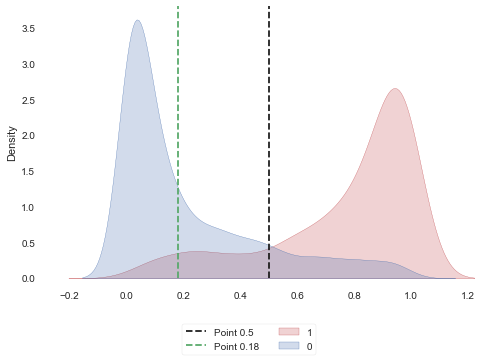

In [134]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.18, ls = '--', color = 'g', label = 'Point 0.18')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

### 3.3 RandomForest

In [135]:
rd = RandomForestClassifier(n_estimators=200)

In [136]:
raw_rd = rd.fit(X_train, y_train)

In [137]:
print(classification_report(y_test, raw_rd.predict(X_test)))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2543
           1       0.94      0.83      0.88       496

    accuracy                           0.96      3039
   macro avg       0.95      0.91      0.93      3039
weighted avg       0.96      0.96      0.96      3039



In [138]:
# predict probability
y_pred_proba = raw_rd.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

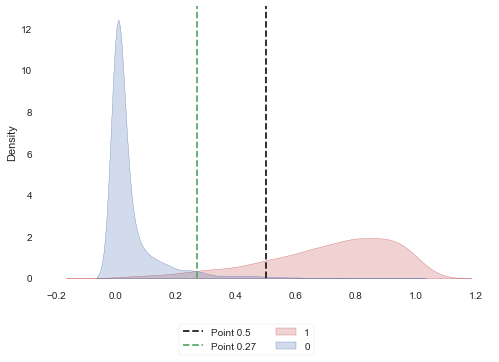

In [139]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.27, ls = '--', color = 'g', label = 'Point 0.27')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [140]:
y_pred_now = pos_proba > 0.27
y_pred_now

array([False, False, False, ..., False, False, False])

In [141]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.99      0.96      0.97      2543
           1       0.81      0.95      0.88       496

    accuracy                           0.96      3039
   macro avg       0.90      0.96      0.93      3039
weighted avg       0.96      0.96      0.96      3039



In [142]:
re_rd = rd.fit(X_train_resample, y_train_resample)

In [143]:
print(classification_report(y_test, re_rd.predict(X_test)))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      2543
           1       0.87      0.91      0.89       496

    accuracy                           0.96      3039
   macro avg       0.92      0.94      0.93      3039
weighted avg       0.96      0.96      0.96      3039



In [144]:
# predict probability
y_pred_proba = re_rd.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

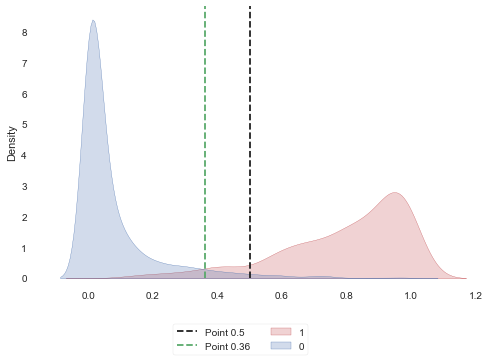

In [150]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.36, ls = '--', color = 'g', label = 'Point 0.36')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [151]:
y_pred_now = pos_proba > 0.36
y_pred_now

array([False, False, False, ..., False, False, False])

In [152]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.99      0.94      0.97      2543
           1       0.77      0.96      0.85       496

    accuracy                           0.95      3039
   macro avg       0.88      0.95      0.91      3039
weighted avg       0.96      0.95      0.95      3039



### 3.4 XGBoostClassifier

In [153]:
xgb = XGBClassifier(random_state=42)

In [154]:
raw_xgb = xgb.fit(X_train, y_train)

[11:44:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [155]:
print(classification_report(y_test, raw_xgb.predict(X_test)))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2543
           1       0.89      0.88      0.89       496

    accuracy                           0.96      3039
   macro avg       0.93      0.93      0.93      3039
weighted avg       0.96      0.96      0.96      3039



In [156]:
# predict probability
y_pred_proba = raw_xgb.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

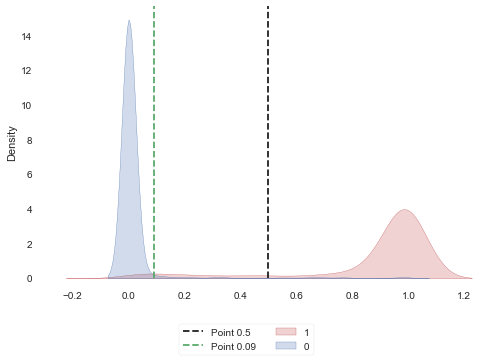

In [157]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.09, ls = '--', color = 'g', label = 'Point 0.09')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [158]:
y_pred_now = pos_proba > 0.09
y_pred_now

array([False, False, False, ..., False, False, False])

In [159]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.99      0.96      0.97      2543
           1       0.81      0.96      0.88       496

    accuracy                           0.96      3039
   macro avg       0.90      0.96      0.93      3039
weighted avg       0.96      0.96      0.96      3039



In [160]:
re_xgb = xgb.fit(X_train_resample, y_train_resample)

[11:45:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [161]:
print(classification_report(y_test, re_xgb.predict(X_test)))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      2543
           1       0.86      0.94      0.90       496

    accuracy                           0.96      3039
   macro avg       0.92      0.95      0.94      3039
weighted avg       0.97      0.96      0.97      3039



In [162]:
# predict probability
y_pred_proba =re_xgb.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

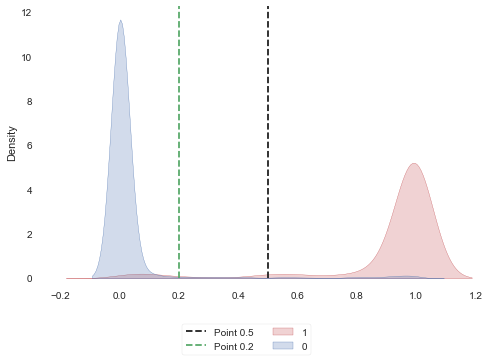

In [166]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.2, ls = '--', color = 'g', label = 'Point 0.2')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [167]:
y_pred_now = pos_proba > 0.2
y_pred_now

array([False, False, False, ..., False, False, False])

In [168]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97      2543
           1       0.80      0.96      0.87       496

    accuracy                           0.95      3039
   macro avg       0.90      0.96      0.92      3039
weighted avg       0.96      0.95      0.96      3039



In [169]:
pd.Series(re_xgb.feature_importances_, index=X_train_resample.columns).sort_values(ascending=False)

Total_Trans_Ct              0.365152
Total_Relationship_Count    0.121381
Total_Revolving_Bal         0.113539
Gender_M                    0.104157
Total_Trans_Amt             0.081782
Total_Ct_Chng_Q4_Q1         0.045568
Total_Amt_Chng_Q4_Q1        0.034590
Customer_Age                0.032396
Months_Inactive_12_mon      0.032200
Contacts_Count_12_mon       0.021954
Credit_Limit                0.019006
Avg_Utilization_Ratio       0.018330
Income_Category             0.009945
dtype: float32

In [170]:
imp_fts = pd.Series(re_xgb.feature_importances_, index=X_train_resample.columns).\
          sort_values(ascending=False).head(8).index.tolist()

In [171]:
imp_fts

['Total_Trans_Ct',
 'Total_Relationship_Count',
 'Total_Revolving_Bal',
 'Gender_M',
 'Total_Trans_Amt',
 'Total_Ct_Chng_Q4_Q1',
 'Total_Amt_Chng_Q4_Q1',
 'Customer_Age']

In [172]:
X_train_new = X_train_resample[imp_fts]
X_test_new = X_test[imp_fts]

In [173]:
new_xgb = xgb.fit(X_train_new, y_train_resample)

[11:47:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [174]:
print(classification_report(y_test, new_xgb.predict(X_test_new)))

              precision    recall  f1-score   support

           0       0.99      0.96      0.97      2543
           1       0.83      0.93      0.88       496

    accuracy                           0.96      3039
   macro avg       0.91      0.95      0.92      3039
weighted avg       0.96      0.96      0.96      3039



In [175]:
# predict probability
y_pred_proba = new_xgb.predict_proba(X_test_new)
# take the churn probability
pos_proba = y_pred_proba[:,1]

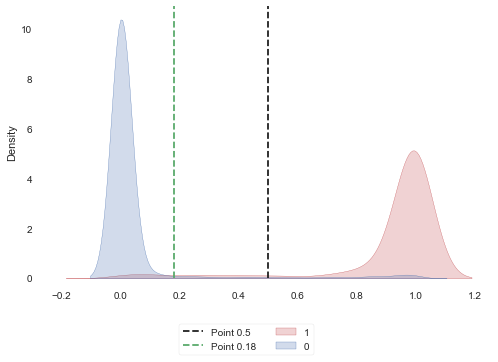

In [183]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.18, ls = '--', color = 'g', label = 'Point 0.18')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [184]:
y_pred_now = pos_proba > 0.18
y_pred_now

array([False, False, False, ..., False, False, False])

In [185]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.99      0.94      0.97      2543
           1       0.77      0.96      0.86       496

    accuracy                           0.95      3039
   macro avg       0.88      0.95      0.91      3039
weighted avg       0.96      0.95      0.95      3039



In [188]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

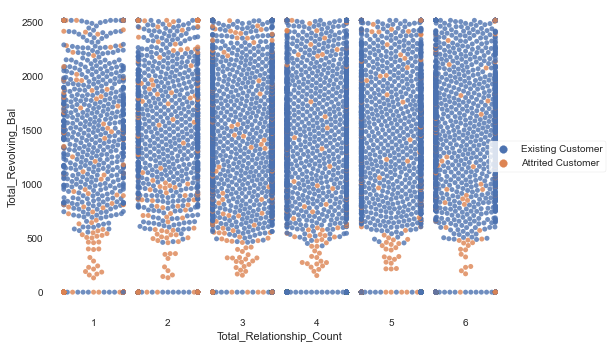

In [195]:
sns.swarmplot(data=df, x = 'Total_Relationship_Count', y='Total_Revolving_Bal', hue='Attrition_Flag', alpha=0.8)
plt.legend(bbox_to_anchor= (1.1,0.5), loc='center')